In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt


In [5]:
#pip install fanalysis

In [6]:
from fanalysis.mca import MCA

In [7]:
#pip install xgboost

In [8]:
from xgboost import XGBClassifier

In [9]:
#pip install lightgbm

In [10]:
from lightgbm import LGBMClassifier

In [11]:
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier

In [12]:
import joblib

In [13]:
import warnings

In [14]:
import os

# Get the current working directory
current_directory = os.getcwd()

# Print the current working directory
print("Current directory:", current_directory)

Current directory: C:\Users\DELL


In [15]:
import os

# Specify the path to the directory you want to change to
new_directory = 'D:/colombo uni/3rd year 2nd sem/ST 3082/Group Project/Final Project/Jupiter Notebooks'

# Change the current working directory to the new directory
os.chdir(new_directory)

In [16]:
import os

# Get the current working directory
current_directory = os.getcwd()

# Print the current working directory
print("Current directory:", current_directory)

Current directory: D:\colombo uni\3rd year 2nd sem\ST 3082\Group Project\Final Project\Jupiter Notebooks


In [17]:
rs = 73

In [18]:
df = pd.read_csv('diabetes_binary_5050split_health_indicators_BRFSS2015.csv')

In [19]:
styled_df = df.head(5).style

# Set background color, text color, and border for the entire DataFrame
styled_df.set_properties(**{"background-color": "#254E58", "color": "#e9c46a", "border": "1.5px solid black"})

# Modify the color and background color of the table headers (th)
styled_df.set_table_styles([
    {"selector": "th", "props": [("color", 'white'), ("background-color", "#333333")]}
])

,Diabetes_binary,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,HvyAlcoholConsump,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,0.000000,1.000000,0.000000,1.000000,26.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,3.000000,5.000000,30.000000,0.000000,1.000000,4.000000,6.000000,8.000000
1,0.000000,1.000000,1.000000,1.000000,26.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,3.000000,0.000000,0.000000,0.000000,1.000000,12.000000,6.000000,8.000000
2,0.000000,0.000000,0.000000,1.000000,26.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,10.000000,0.000000,1.000000,13.000000,6.000000,8.000000
3,0.000000,1.000000,1.000000,1.000000,28.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,3.000000,0.000000,3.000000,0.000000,1.000000,11.000000,6.000000,8.000000
4,0.000000,0.000000,0.000000,1.000000,29.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,8.000000,5.000000,8.000000


In [20]:
rows , col =  df.shape
print(f"Number of Rows : {rows} \nNumber of Columns : {col}")

Number of Rows : 70692 
Number of Columns : 22


In [21]:
# Basic Information
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70692 entries, 0 to 70691
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Diabetes_binary       70692 non-null  float64
 1   HighBP                70692 non-null  float64
 2   HighChol              70692 non-null  float64
 3   CholCheck             70692 non-null  float64
 4   BMI                   70692 non-null  float64
 5   Smoker                70692 non-null  float64
 6   Stroke                70692 non-null  float64
 7   HeartDiseaseorAttack  70692 non-null  float64
 8   PhysActivity          70692 non-null  float64
 9   Fruits                70692 non-null  float64
 10  Veggies               70692 non-null  float64
 11  HvyAlcoholConsump     70692 non-null  float64
 12  AnyHealthcare         70692 non-null  float64
 13  NoDocbcCost           70692 non-null  float64
 14  GenHlth               70692 non-null  float64
 15  MentHlth           

In [22]:
## counting NAN values
df.isnull().sum()

Diabetes_binary         0
HighBP                  0
HighChol                0
CholCheck               0
BMI                     0
Smoker                  0
Stroke                  0
HeartDiseaseorAttack    0
PhysActivity            0
Fruits                  0
Veggies                 0
HvyAlcoholConsump       0
AnyHealthcare           0
NoDocbcCost             0
GenHlth                 0
MentHlth                0
PhysHlth                0
DiffWalk                0
Sex                     0
Age                     0
Education               0
Income                  0
dtype: int64

In [23]:
## all float types are coverted into integer
df = df.astype(int)
df['BMI'] = df['BMI'].astype(float)
df['MentHlth'] = df['MentHlth'].astype(float)
df['PhysHlth'] = df['PhysHlth'].astype(float)

In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70692 entries, 0 to 70691
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Diabetes_binary       70692 non-null  int32  
 1   HighBP                70692 non-null  int32  
 2   HighChol              70692 non-null  int32  
 3   CholCheck             70692 non-null  int32  
 4   BMI                   70692 non-null  float64
 5   Smoker                70692 non-null  int32  
 6   Stroke                70692 non-null  int32  
 7   HeartDiseaseorAttack  70692 non-null  int32  
 8   PhysActivity          70692 non-null  int32  
 9   Fruits                70692 non-null  int32  
 10  Veggies               70692 non-null  int32  
 11  HvyAlcoholConsump     70692 non-null  int32  
 12  AnyHealthcare         70692 non-null  int32  
 13  NoDocbcCost           70692 non-null  int32  
 14  GenHlth               70692 non-null  int32  
 15  MentHlth           

In [25]:
# define a function to simplify the plots in further sections
def ida_plot(li_col, row, col=3, figsize=(20, 5)):
    
    """
    This function return plt subplots by 
    looping through the df columns
    display only the desired columns
    """
    
    # prepare subplot format
    fig, ax = plt.subplots(row, col, figsize=figsize)
    axe = ax.ravel()

    # use for loop to plot
    for i in range(len(li_col)):

        # create bar charts for each column
        sns.countplot(x=df[li_col[i]], ax=axe[i])

    # adjust the spacing of the subplots
    plt.subplots_adjust(
        wspace=0.5, 
        hspace=0.5
    )

In [26]:
df.duplicated()

0        False
1        False
2        False
3        False
4        False
         ...  
70687    False
70688    False
70689    False
70690    False
70691    False
Length: 70692, dtype: bool

In [27]:
## checking for category levels in each variable
# Initialize an empty dictionary to store unique category levels for each variable
unique_levels_dict = {}

# Iterate through each column in the DataFrame
for column in df.columns:
    # Get unique category levels for the column
    unique_levels = df[column].unique()
    # Store the unique category levels in the dictionary
    unique_levels_dict[column] = unique_levels

# Print the dictionary containing unique category levels for each variable
for variable, levels in unique_levels_dict.items():
    print(f"Variable: {variable}")
    print("Unique category levels:", levels)
    print()

Variable: Diabetes_binary
Unique category levels: [0 1]

Variable: HighBP
Unique category levels: [1 0]

Variable: HighChol
Unique category levels: [0 1]

Variable: CholCheck
Unique category levels: [1 0]

Variable: BMI
Unique category levels: [26. 28. 29. 18. 31. 32. 27. 24. 21. 58. 30. 20. 22. 38. 40. 25. 36. 47.
 19. 37. 41. 23. 34. 35. 42. 17. 33. 44. 15. 52. 69. 56. 45. 39. 92. 53.
 98. 50. 46. 79. 48. 16. 63. 72. 54. 49. 68. 43. 84. 73. 76. 55. 51. 75.
 57. 60. 12. 77. 82. 67. 71. 61. 14. 81. 59. 86. 13. 87. 65. 95. 89. 62.
 64. 66. 85. 70. 83. 80. 78. 74.]

Variable: Smoker
Unique category levels: [0 1]

Variable: Stroke
Unique category levels: [0 1]

Variable: HeartDiseaseorAttack
Unique category levels: [0 1]

Variable: PhysActivity
Unique category levels: [1 0]

Variable: Fruits
Unique category levels: [0 1]

Variable: Veggies
Unique category levels: [1 0]

Variable: HvyAlcoholConsump
Unique category levels: [0 1]

Variable: AnyHealthcare
Unique category levels: [1 0]

Variab

<Axes: xlabel='Diabetes_binary', ylabel='count'>

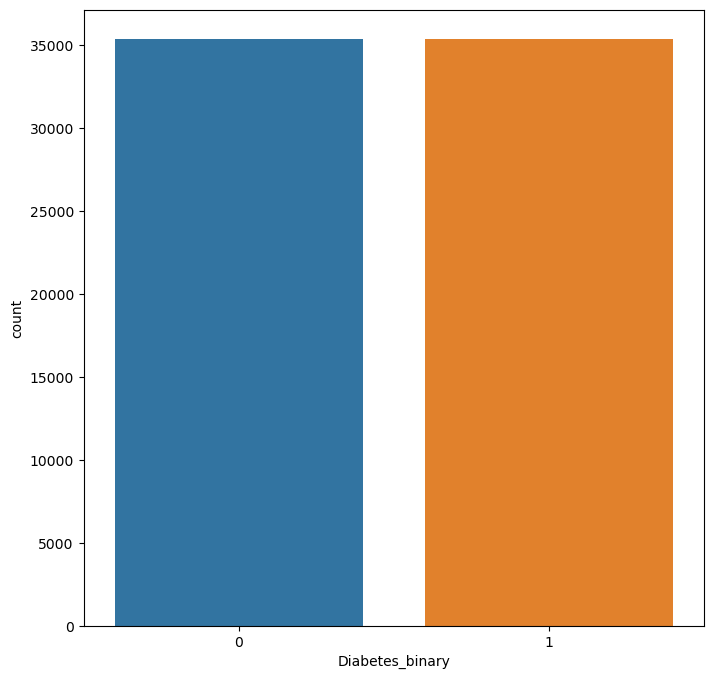

In [28]:
fig, ax = plt.subplots(figsize=(8, 8))
sns.countplot(data=df, x='Diabetes_binary')

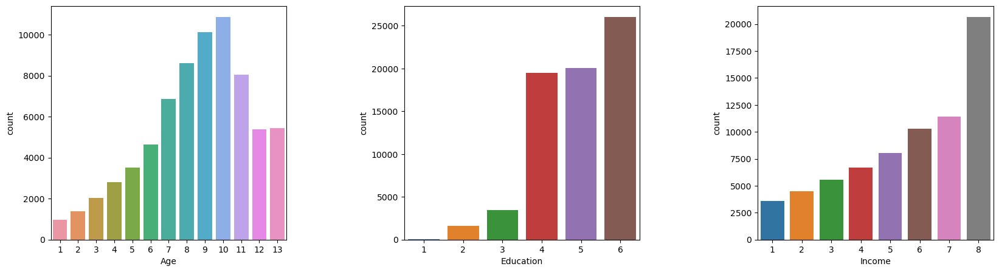

In [29]:
ida_plot(['Age', 'Education', 'Income'], 1, 3)

In [30]:
## recarogarizing

## age variable
# Create a mapping dictionary to map original categories to new categories
category_mapping = {
    1: 1,
    2: 1,
    3: 2,
    4: 2,
    5: 2,
    6: 2,
    7: 3,
    8: 3,
    9: 3,
    10: 3,
    11: 4,
    12: 4,
    13: 4
    
}

# Use map function to apply the mapping to the age column
df['Age'] = df['Age'].map(category_mapping)

# Check the result
print(df['Age'].value_counts())

Age
3    36443
4    18864
2    13010
1     2375
Name: count, dtype: int64


In [31]:
## cheching if recategorization is right
unique_levels = df['Age'].unique()

# Print the unique category levels
print("Unique category levels:", unique_levels)

Unique category levels: [2 4 3 1]


In [32]:
## recarogarizing

## Education variable
# Create a mapping dictionary to map original categories to new categories
category_mapping2 = {
    1: 1,
    2: 2,
    3: 2,
    4: 2,
    5: 3,
    6: 4
    
}

# Use map function to apply the mapping to the age column
df['Education'] = df['Education'].map(category_mapping2)

# Check the result
print(df['Education'].value_counts())

Education
4    26020
2    24567
3    20030
1       75
Name: count, dtype: int64


In [33]:
## cheching if recategorization is right
unique_levels2 = df['Education'].unique()

# Print the unique category levels
print("Unique category levels:", unique_levels2)

Unique category levels: [4 3 2 1]


In [34]:
## recarogarizing

## Income variable
# Create a mapping dictionary to map original categories to new categories
category_mapping3 = {
    1: 1,
    2: 1,
    3: 1,
    4: 1,
    5: 2,
    6: 2,
    7: 3,
    8: 4
    
}

# Use map function to apply the mapping to the age column
df['Income'] = df['Income'].map(category_mapping3)

# Check the result
print(df['Income'].value_counts())

Income
4    20646
1    20324
2    18297
3    11425
Name: count, dtype: int64


In [35]:
## cheching if recategorization is right
unique_levels3 = df['Income'].unique()

# Print the unique category levels
print("Unique category levels:", unique_levels3)

Unique category levels: [4 3 2 1]


In [36]:
## introducing dependent and independent variables
fea = df.drop(columns="Diabetes_binary")
tar = df["Diabetes_binary"]
print(fea)
print(tar)

       HighBP  HighChol  CholCheck   BMI  Smoker  Stroke  \
0           1         0          1  26.0       0       0   
1           1         1          1  26.0       1       1   
2           0         0          1  26.0       0       0   
3           1         1          1  28.0       1       0   
4           0         0          1  29.0       1       0   
...       ...       ...        ...   ...     ...     ...   
70687       0         1          1  37.0       0       0   
70688       0         1          1  29.0       1       0   
70689       1         1          1  25.0       0       0   
70690       1         1          1  18.0       0       0   
70691       1         1          1  25.0       0       0   

       HeartDiseaseorAttack  PhysActivity  Fruits  Veggies  ...  \
0                         0             1       0        1  ...   
1                         0             0       1        0  ...   
2                         0             1       1        1  ...   
3          

In [37]:
df

,Diabetes_binary,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,0,1,0,1,26.0,0,0,0,1,0,...,1,0,3,5.0,30.0,0,1,2,4,4
1,0,1,1,1,26.0,1,1,0,0,1,...,1,0,3,0.0,0.0,0,1,4,4,4
2,0,0,0,1,26.0,0,0,0,1,1,...,1,0,1,0.0,10.0,0,1,4,4,4
3,0,1,1,1,28.0,1,0,0,1,1,...,1,0,3,0.0,3.0,0,1,4,4,4
4,0,0,0,1,29.0,1,0,0,1,1,...,1,0,2,0.0,0.0,0,0,3,3,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70687,1,0,1,1,37.0,0,0,0,0,0,...,1,0,4,0.0,0.0,0,0,2,2,1
70688,1,0,1,1,29.0,1,0,1,0,1,...,1,0,2,0.0,0.0,1,1,3,2,2
70689,1,1,1,1,25.0,0,0,1,0,1,...,1,0,5,15.0,0.0,1,0,4,4,1
70690,1,1,1,1,18.0,0,0,0,0,0,...,1,0,4,0.0,0.0,1,0,4,2,1


In [38]:
## splitting data into training,testing
X_train, X_test, y_train, y_test = train_test_split(fea, tar, test_size=0.3, shuffle=True, random_state=rs)

# check shapes of split
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(49484, 21)
(21208, 21)
(49484,)
(21208,)


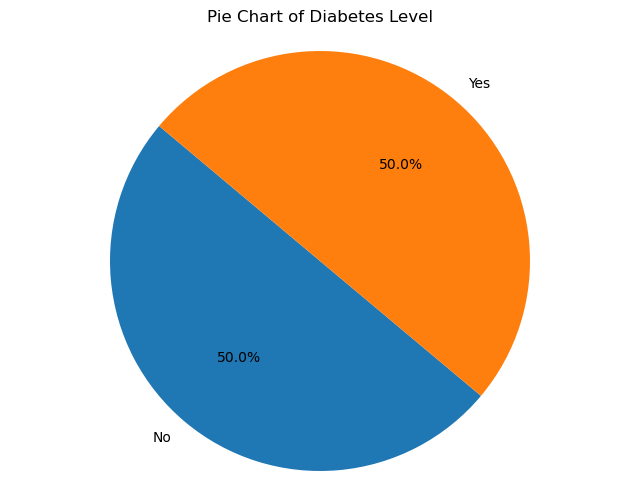

In [39]:
## Descriptive Analysis

# Diabetes Variable
category_counts1 = y_train.value_counts()
category_counts1.index = ['No', 'Yes']
# Plot a pie chart
plt.figure(figsize=(8, 6))
plt.pie(category_counts1, labels=category_counts1.index, autopct='%1.1f%%', startangle=140)
plt.title('Pie Chart of Diabetes Level')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle
plt.savefig('pie_chart_Diabetes.png')
plt.show()


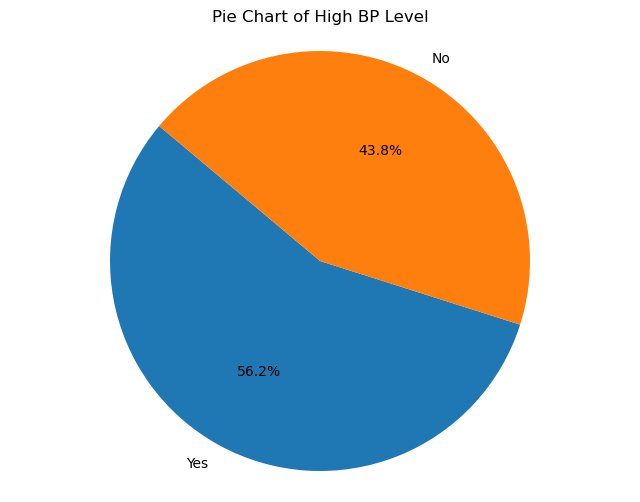

In [40]:


# High BP level
category_counts2 = X_train['HighBP'].value_counts()
category_counts2.index = ['Yes', 'No']
# Plot a pie chart
plt.figure(figsize=(8, 6))
plt.pie(category_counts2, labels=category_counts2.index, autopct='%1.1f%%', startangle=140)
plt.title('Pie Chart of High BP Level')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle
plt.savefig('pie_chart_HighBP.png')
plt.show()

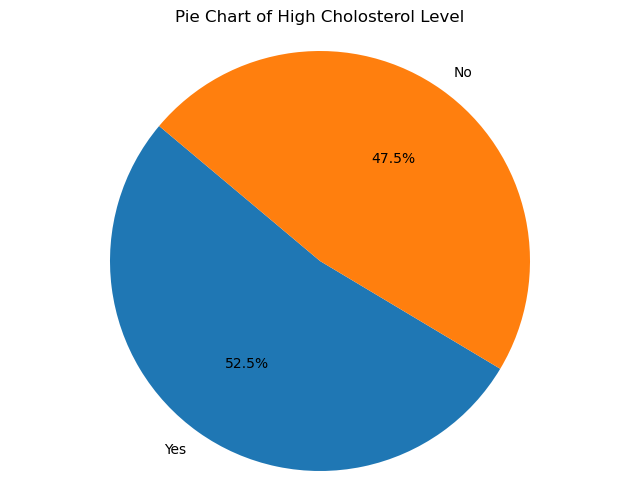

In [41]:

# High Cholosterol level 
category_counts3 = X_train['HighChol'].value_counts()
category_counts3.index = ['Yes', 'No']
# Plot a pie chart
plt.figure(figsize=(8, 6))
plt.pie(category_counts3, labels=category_counts3.index, autopct='%1.1f%%', startangle=140)
plt.title('Pie Chart of High Cholosterol Level')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle
plt.savefig('pie_chart_HighChol.png')
plt.show()

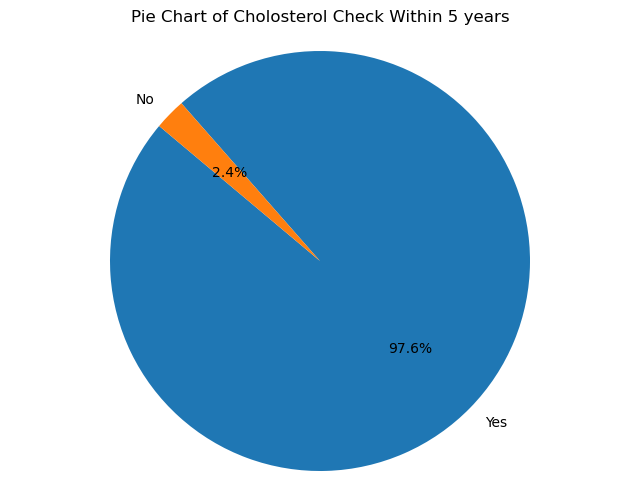

In [42]:
# Cholosterol Check Within 5 years 
category_counts4 = X_train['CholCheck'].value_counts()
category_counts4.index = ['Yes', 'No']
# Plot a pie chart
plt.figure(figsize=(8, 6))
plt.pie(category_counts4, labels=category_counts4.index, autopct='%1.1f%%', startangle=140)
plt.title('Pie Chart of Cholosterol Check Within 5 years')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle
plt.savefig('pie_chart_CholCheck.png')
plt.show()

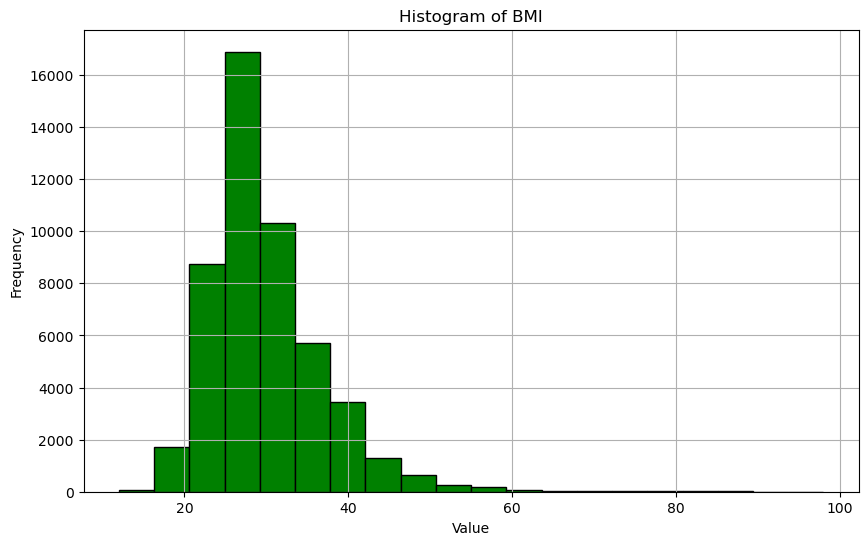

In [43]:
# BMI
plt.figure(figsize=(10, 6))
plt.hist(X_train['BMI'], bins=20, color='green', edgecolor='black')
plt.title('Histogram of BMI')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.grid(True)
plt.savefig('histogram_BMI.png')
plt.show()

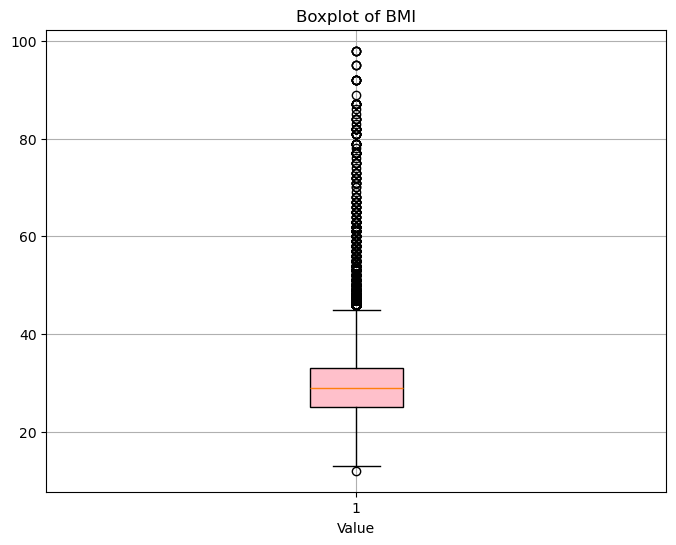

In [44]:
# Draw a boxplot for BMI
plt.figure(figsize=(8, 6))
plt.boxplot(X_train['BMI'], patch_artist=True, boxprops=dict(facecolor='pink'))
plt.title('Boxplot of BMI')
plt.xlabel('Value')
plt.grid(True)
plt.savefig('boxplot_BMI.png')
plt.show()

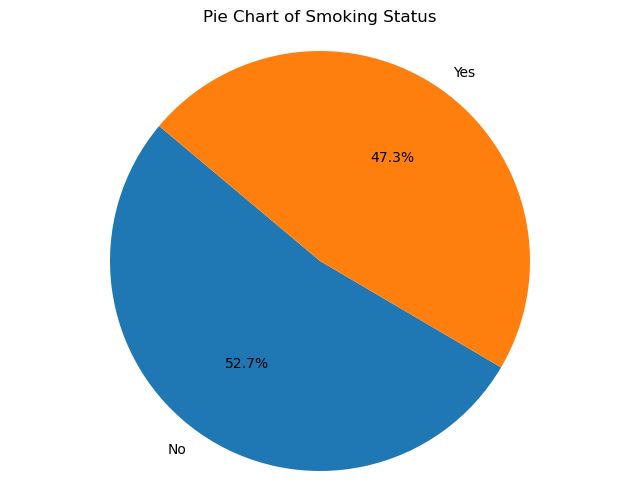

In [45]:
# Smoker 
category_counts5 = X_train['Smoker'].value_counts()
category_counts5.index = ['No', 'Yes']
# Plot a pie chart
plt.figure(figsize=(8, 6))
plt.pie(category_counts5, labels=category_counts5.index, autopct='%1.1f%%', startangle=140)
plt.title('Pie Chart of Smoking Status')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle
plt.savefig('pie_chart_Smoke.png')
plt.show()

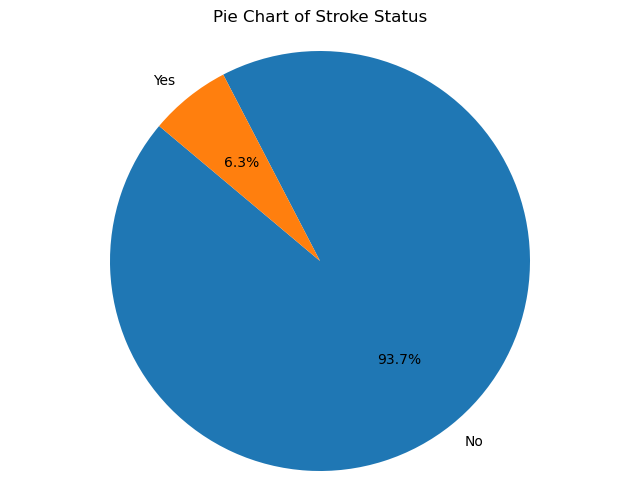

In [46]:
# Stroke
category_counts6 = X_train['Stroke'].value_counts()
category_counts6.index = ['No', 'Yes']
# Plot a pie chart
plt.figure(figsize=(8, 6))
plt.pie(category_counts6, labels=category_counts6.index, autopct='%1.1f%%', startangle=140)
plt.title('Pie Chart of Stroke Status')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle
plt.savefig('pie_chart_Stroke.png')
plt.show()

In [47]:
#pip install prince

In [48]:
from prince import FAMD

In [49]:
# Assuming X_train and y_train are your training data and target variable, respectively
# Convert y_train to a DataFrame
y_train_df = pd.DataFrame(y_train)

# Concatenate X_train and y_train_df along the columns axis
df1 = pd.concat([X_train, y_train_df], axis=1)

# Display the resulting DataFrame
print(df1)

       HighBP  HighChol  CholCheck   BMI  Smoker  Stroke  \
26629       1         1          1  27.0       1       0   
31609       0         0          1  24.0       0       0   
44065       0         1          1  27.0       1       0   
35884       1         1          1  24.0       1       0   
45382       1         1          1  22.0       1       0   
...       ...       ...        ...   ...     ...     ...   
64327       0         0          1  32.0       0       0   
34470       1         1          1  19.0       0       0   
41281       1         1          1  21.0       1       0   
46472       1         1          1  31.0       1       0   
69550       0         0          1  27.0       0       0   

       HeartDiseaseorAttack  PhysActivity  Fruits  Veggies  ...  NoDocbcCost  \
26629                     0             1       1        1  ...            0   
31609                     0             1       1        1  ...            0   
44065                     0            

In [50]:
df1 = df1.astype(int)
df1['BMI'] = df1['BMI'].astype(float)
df1['MentHlth'] = df1['MentHlth'].astype(float)
df1['PhysHlth'] = df1['PhysHlth'].astype(float)

In [51]:
df1

,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,...,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income,Diabetes_binary
26629,1,1,1,27.0,1,0,0,1,1,1,...,0,1,0.0,0.0,0,0,4,3,4,0
31609,0,0,1,24.0,0,0,0,1,1,1,...,0,2,3.0,0.0,0,1,1,4,2,0
44065,0,1,1,27.0,1,0,0,1,1,1,...,0,2,0.0,0.0,0,1,3,4,4,1
35884,1,1,1,24.0,1,0,1,1,1,0,...,0,1,0.0,18.0,1,0,4,4,1,1
45382,1,1,1,22.0,1,0,0,1,1,1,...,0,4,0.0,1.0,0,1,4,4,4,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64327,0,0,1,32.0,0,0,0,0,1,1,...,0,4,15.0,10.0,0,0,3,4,4,1
34470,1,1,1,19.0,0,0,0,1,1,1,...,0,2,0.0,2.0,0,0,4,4,4,0
41281,1,1,1,21.0,1,0,1,1,0,0,...,0,3,0.0,0.0,0,0,3,2,1,1
46472,1,1,1,31.0,1,0,0,1,1,0,...,0,1,0.0,30.0,0,0,2,3,2,1


In [52]:
# associations

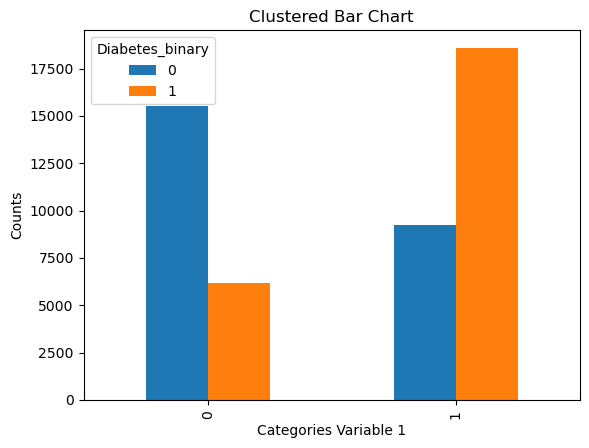

In [53]:
# cluster bar chart of diabetes level and high BP
import matplotlib.pyplot as plt
# Group by the two categorical variables and count occurrences
grouped_df = df1.groupby([X_train['HighBP'],y_train]).size().unstack(fill_value=0)

# Plot
grouped_df.plot(kind='bar', stacked=False)

# Add labels and title
plt.xlabel('Categories Variable 1')
plt.ylabel('Counts')
plt.title('Clustered Bar Chart')

# Show plot
plt.show()

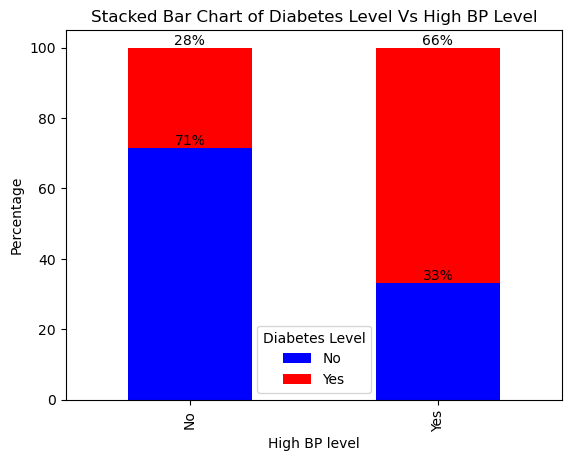

In [54]:
## stacked bar chart
# Group by the two categorical variables and count occurrences
#grouped_df = df1.groupby([X_train['HighBP'],y_train]).size().unstack(fill_value=0)
grouped_df = df1.groupby(['HighBP','Diabetes_binary']).size().unstack(fill_value=0)
# Normalize the data to get percentages
grouped_df_percent = grouped_df.div(grouped_df.sum(axis=1), axis=0) * 100

# Plot
ax = grouped_df_percent.plot(kind='bar', stacked=True,color=['blue', 'red'])

# Add labels and title
plt.xlabel('High BP level')
plt.ylabel('Percentage')
plt.title('Stacked Bar Chart of Diabetes Level Vs High BP Level')

# Set the tick labels for both x-axis and legend
ax.set_xticklabels(['No', 'Yes'])
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles, ['No', 'Yes'],title='Diabetes Level')

# Add percentages as labels on the bars
for container in ax.containers:
    ax.bar_label(container, labels=[f'{int(val)}%' for val in container.datavalues])

# Show plot
plt.show()

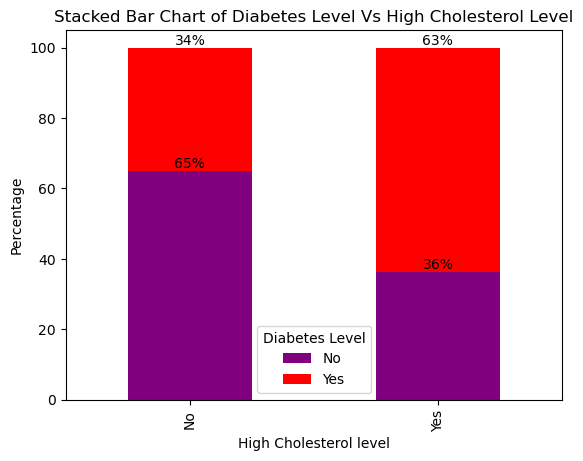

In [55]:
## stacked bar chart of diabetes level and high cholesterol
# Group by the two categorical variables and count occurrences
grouped_df = df1.groupby(['HighChol','Diabetes_binary']).size().unstack(fill_value=0)

# Normalize the data to get percentages
grouped_df_percent = grouped_df.div(grouped_df.sum(axis=1), axis=0) * 100

# Plot
ax = grouped_df_percent.plot(kind='bar', stacked=True,color=['purple', 'red'])

# Add labels and title
plt.xlabel('High Cholesterol level')
plt.ylabel('Percentage')
plt.title('Stacked Bar Chart of Diabetes Level Vs High Cholesterol Level')

# Set the tick labels for both x-axis and legend
ax.set_xticklabels(['No', 'Yes'])
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles, ['No', 'Yes'],title='Diabetes Level')

# Add percentages as labels on the bars
for container in ax.containers:
    ax.bar_label(container, labels=[f'{int(val)}%' for val in container.datavalues])

# Show plot
plt.show()

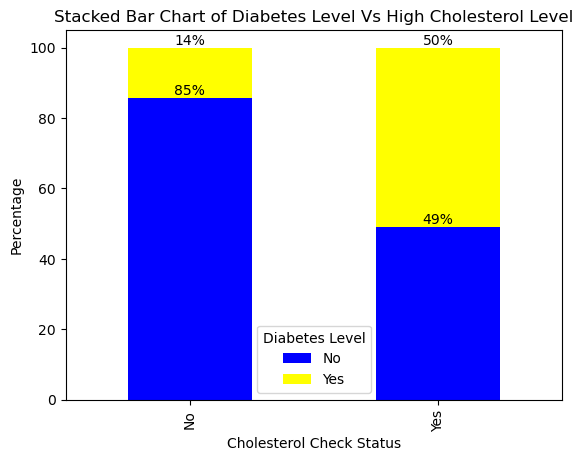

In [56]:
## stacked bar chart of diabetes level and high cholesterol
# Group by the two categorical variables and count occurrences
grouped_df = df1.groupby(['CholCheck','Diabetes_binary']).size().unstack(fill_value=0)

# Normalize the data to get percentages
grouped_df_percent = grouped_df.div(grouped_df.sum(axis=1), axis=0) * 100

# Plot
ax = grouped_df_percent.plot(kind='bar', stacked=True,color=['blue', 'yellow'])

# Add labels and title
plt.xlabel('Cholesterol Check Status')
plt.ylabel('Percentage')
plt.title('Stacked Bar Chart of Diabetes Level Vs High Cholesterol Level')

# Set the tick labels for both x-axis and legend
ax.set_xticklabels(['No', 'Yes'])
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles, ['No', 'Yes'],title='Diabetes Level')

# Add percentages as labels on the bars
for container in ax.containers:
    ax.bar_label(container, labels=[f'{int(val)}%' for val in container.datavalues])

# Show plot
plt.show()

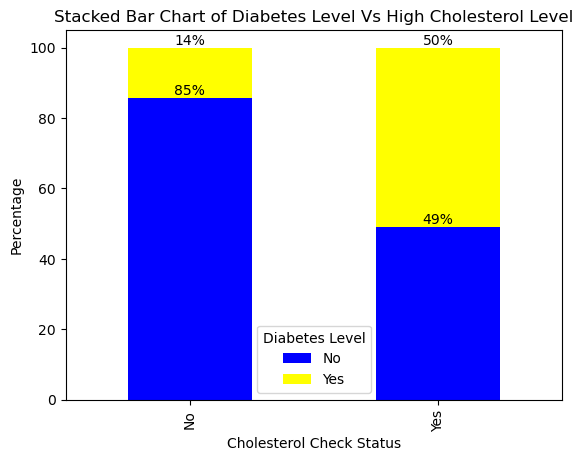

In [57]:
## stacked bar chart of diabetes level and high cholesterol
# Group by the two categorical variables and count occurrences
grouped_df = df1.groupby(['CholCheck','Diabetes_binary']).size().unstack(fill_value=0)

# Normalize the data to get percentages
grouped_df_percent = grouped_df.div(grouped_df.sum(axis=1), axis=0) * 100

# Plot
ax = grouped_df_percent.plot(kind='bar', stacked=True,color=['blue', 'yellow'])

# Add labels and title
plt.xlabel('Cholesterol Check Status')
plt.ylabel('Percentage')
plt.title('Stacked Bar Chart of Diabetes Level Vs High Cholesterol Level')

# Set the tick labels for both x-axis and legend
ax.set_xticklabels(['No', 'Yes'])
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles, ['No', 'Yes'],title='Diabetes Level')

# Add percentages as labels on the bars
for container in ax.containers:
    ax.bar_label(container, labels=[f'{int(val)}%' for val in container.datavalues])

# Show plot
plt.show()

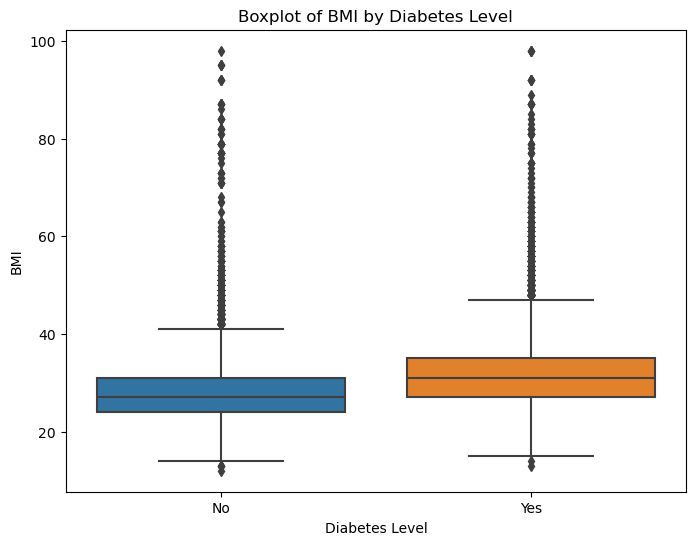

In [58]:
## boxplots of BMI and Diabetes Levels
# Plot boxplot
plt.figure(figsize=(8, 6))
sns.boxplot(x='Diabetes_binary', y='BMI', data=df1)

# Set the tick labels for the x-axis
plt.gca().set_xticklabels(['No', 'Yes'])
plt.xlabel('Diabetes Level')
plt.ylabel('BMI')
plt.title('Boxplot of BMI by Diabetes Level')
plt.show()

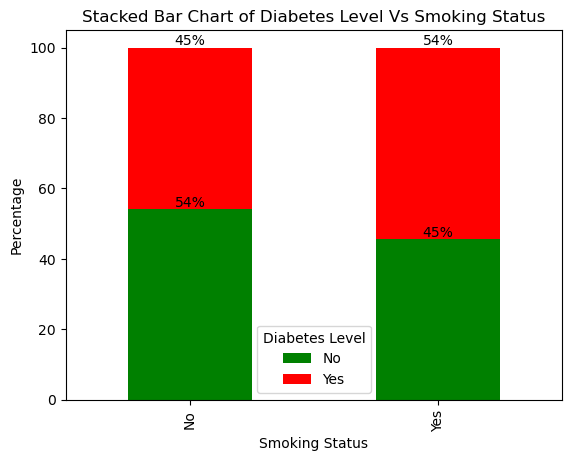

In [59]:
## stacked bar chart of diabetes level and smoking level
# Group by the two categorical variables and count occurrences
grouped_df = df1.groupby(['Smoker','Diabetes_binary']).size().unstack(fill_value=0)

# Normalize the data to get percentages
grouped_df_percent = grouped_df.div(grouped_df.sum(axis=1), axis=0) * 100

# Plot
ax = grouped_df_percent.plot(kind='bar', stacked=True,color=['green', 'red'])

# Add labels and title
plt.xlabel('Smoking Status')
plt.ylabel('Percentage')
plt.title('Stacked Bar Chart of Diabetes Level Vs Smoking Status')

# Set the tick labels for both x-axis and legend
ax.set_xticklabels(['No', 'Yes'])
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles, ['No', 'Yes'],title='Diabetes Level')

# Add percentages as labels on the bars
for container in ax.containers:
    ax.bar_label(container, labels=[f'{int(val)}%' for val in container.datavalues])

# Show plot
plt.show()

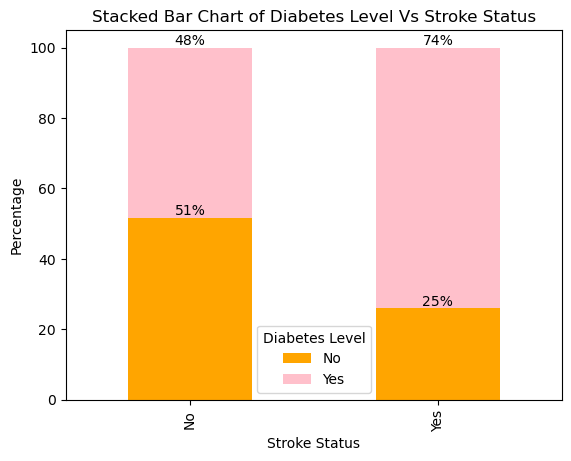

In [60]:
## stacked bar chart of diabetes level and stroke level
# Group by the two categorical variables and count occurrences
grouped_df = df1.groupby(['Stroke','Diabetes_binary']).size().unstack(fill_value=0)

# Normalize the data to get percentages
grouped_df_percent = grouped_df.div(grouped_df.sum(axis=1), axis=0) * 100

# Plot
ax = grouped_df_percent.plot(kind='bar', stacked=True,color=['orange', 'pink'])

# Add labels and title
plt.xlabel('Stroke Status')
plt.ylabel('Percentage')
plt.title('Stacked Bar Chart of Diabetes Level Vs Stroke Status')

# Set the tick labels for both x-axis and legend
ax.set_xticklabels(['No', 'Yes'])
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles, ['No', 'Yes'],title='Diabetes Level')

# Add percentages as labels on the bars
for container in ax.containers:
    ax.bar_label(container, labels=[f'{int(val)}%' for val in container.datavalues])

# Show plot
plt.show()

In [61]:
famd = FAMD(
    n_components=2,
    n_iter=3,
    copy=True,
    check_input=True,
    random_state=42,
    engine="sklearn",
    handle_unknown="error"  # same parameter as sklearn.preprocessing.OneHotEncoder
)
famd = famd.fit(df1)

C:\Users\DELL\anaconda3\Lib\site-packages\prince\pca.py:175: PerformanceWarning: Concatenating sparse arrays with multiple fill values: '[-0.5653748980647559, -1.327838758103112, -2.210846565223556, -1.5903939518737666, -0.6543074045229906, -3.011956477173332, -0.47897556255396423, -3.044763112374444, -2.1791851946361094, -2.1797137168625564, -2.6667150825502697, -1.5455195464629068, -0.10368678701722892, -1.8156822310832035, -1.6429997889602181, -1.868983354501437, -1.9200062225399663, -2.4111358537850593, -1.0581278889506465, -1.6378504073432754, -1.7743991777504449, -1.3310157558666273, -0.8818820949671515, -2.844308303607756, -1.187396426652855, -2.0396650732078827, -2.3107934544514968, -2.1235459727025527, -2.2339544538371348, -3.015046268516181, -0.6399187438313185, -1.6424738887742323, -1.5714498952432572, -1.2414610129234849, -1.670807979639133, -2.93411230786466, -0.9439199991721329, -1.6800322275201824, -2.584084308704647, -2.2705647739121906, -2.0843549619652313, -2.23657402

In [62]:
eig_sum = famd.eigenvalues_summary
eig_sum

,eigenvalue,% of variance,% of variance (cumulative)
component,,,
0,32.086,11.93%,11.93%
1,15.876,5.90%,17.83%


In [63]:
c = eig_sum['% of variance']
c

component
0    11.93%
1     5.90%
Name: % of variance, dtype: object

In [64]:
famd.row_coordinates(df1).head()

C:\Users\DELL\anaconda3\Lib\site-packages\prince\pca.py:175: PerformanceWarning: Concatenating sparse arrays with multiple fill values: '[-0.5653748980647559, -1.327838758103112, -2.210846565223556, -1.5903939518737666, -0.6543074045229906, -3.011956477173332, -0.47897556255396423, -3.044763112374444, -2.1791851946361094, -2.1797137168625564, -2.6667150825502697, -1.5455195464629068, -0.10368678701722892, -1.8156822310832035, -1.6429997889602181, -1.868983354501437, -1.9200062225399663, -2.4111358537850593, -1.0581278889506465, -1.6378504073432754, -1.7743991777504449, -1.3310157558666273, -0.8818820949671515, -2.844308303607756, -1.187396426652855, -2.0396650732078827, -2.3107934544514968, -2.1235459727025527, -2.2339544538371348, -3.015046268516181, -0.6399187438313185, -1.6424738887742323, -1.5714498952432572, -1.2414610129234849, -1.670807979639133, -2.93411230786466, -0.9439199991721329, -1.6800322275201824, -2.584084308704647, -2.2705647739121906, -2.0843549619652313, -2.23657402

component,0,1
26629,-3.335792,-2.996934
31609,-9.108077,1.480012
44065,-4.098498,-4.601460
35884,5.968705,-2.652123
45382,0.787735,-6.550527


In [65]:
col=famd.column_coordinates_
col

component,0,1
variable,,
BMI,0.097731,0.000229
MentHlth,0.071578,0.057286
PhysHlth,0.250321,0.030428
Age,0.181279,0.246585
AnyHealthcare,0.001590,0.201345
CholCheck,0.014740,0.099712
Diabetes_binary,0.376880,0.068256
DiffWalk,0.407205,0.019548
Education,0.219291,0.104650


In [66]:
import altair as alt

In [67]:
alt.data_transformers.disable_max_rows()

DataTransformerRegistry.enable('default')

In [68]:
famd.column_contributions_.style.format('{:.0%}')

component,0,1
variable,,
BMI,0%,0%
MentHlth,0%,0%
PhysHlth,1%,0%
Age,1%,2%
AnyHealthcare,0%,1%
CholCheck,0%,1%
Diabetes_binary,1%,0%
DiffWalk,1%,0%
Education,1%,1%


In [69]:
# Convert col to a NumPy array
col_array = np.array(col)

# Convert the array to a DataFrame
col_df = pd.DataFrame(col_array, columns=['Component 1', 'Component 2'])
# Print the DataFrame
print(col_df)

    Component 1  Component 2
0      0.097731     0.000229
1      0.071578     0.057286
2      0.250321     0.030428
3      0.181279     0.246585
4      0.001590     0.201345
5      0.014740     0.099712
6      0.376880     0.068256
7      0.407205     0.019548
8      0.219291     0.104650
9      0.028940     0.066966
10     0.542055     0.083547
11     0.206438     0.036362
12     0.326434     0.119005
13     0.199254     0.101676
14     0.012347     0.007665
15     0.347637     0.155877
16     0.037175     0.233497
17     0.186466     0.044973
18     0.000371     0.030259
19     0.073557     0.001373
20     0.113096     0.001971
21     0.059103     0.050506


In [70]:
famd.plot(
    df1,
    x_component=0,
    y_component=1
)


C:\Users\DELL\anaconda3\Lib\site-packages\prince\pca.py:175: PerformanceWarning: Concatenating sparse arrays with multiple fill values: '[-0.5653748980647559, -1.327838758103112, -2.210846565223556, -1.5903939518737666, -0.6543074045229906, -3.011956477173332, -0.47897556255396423, -3.044763112374444, -2.1791851946361094, -2.1797137168625564, -2.6667150825502697, -1.5455195464629068, -0.10368678701722892, -1.8156822310832035, -1.6429997889602181, -1.868983354501437, -1.9200062225399663, -2.4111358537850593, -1.0581278889506465, -1.6378504073432754, -1.7743991777504449, -1.3310157558666273, -0.8818820949671515, -2.844308303607756, -1.187396426652855, -2.0396650732078827, -2.3107934544514968, -2.1235459727025527, -2.2339544538371348, -3.015046268516181, -0.6399187438313185, -1.6424738887742323, -1.5714498952432572, -1.2414610129234849, -1.670807979639133, -2.93411230786466, -0.9439199991721329, -1.6800322275201824, -2.584084308704647, -2.2705647739121906, -2.0843549619652313, -2.23657402

alt.LayerChart(...)

In [71]:
column_names = df1.columns
print(column_names)

Index(['HighBP', 'HighChol', 'CholCheck', 'BMI', 'Smoker', 'Stroke',
       'HeartDiseaseorAttack', 'PhysActivity', 'Fruits', 'Veggies',
       'HvyAlcoholConsump', 'AnyHealthcare', 'NoDocbcCost', 'GenHlth',
       'MentHlth', 'PhysHlth', 'DiffWalk', 'Sex', 'Age', 'Education', 'Income',
       'Diabetes_binary'],
      dtype='object')


C:\Users\DELL\AppData\Local\Temp\ipykernel_11192\3794674456.py:7: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.annotate(txt, (col[0][i], col[1][i]))


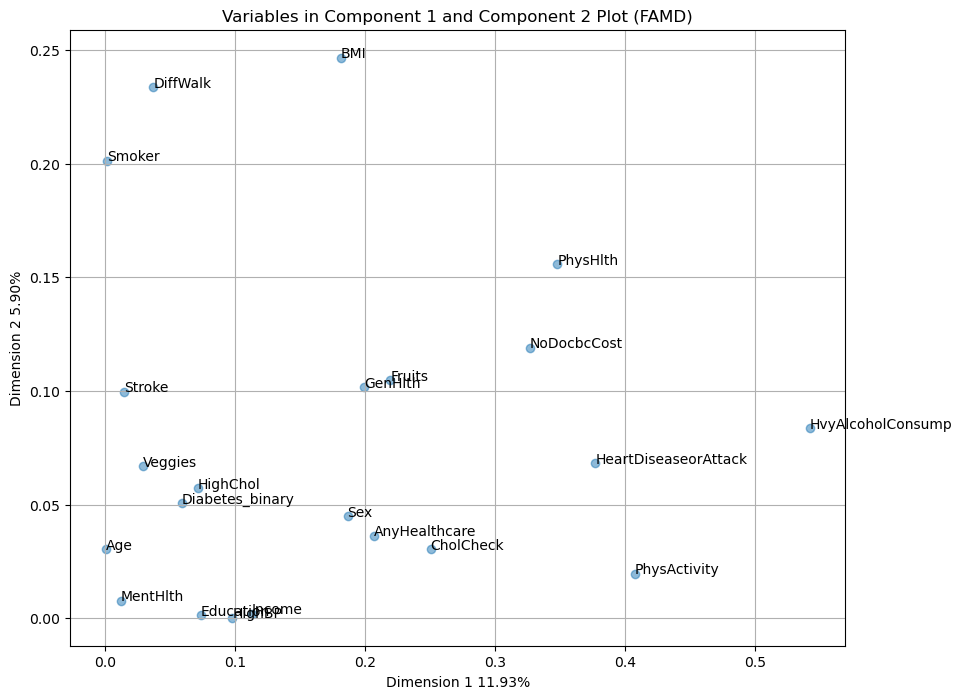

In [72]:
# Plot the variables in the FAMD space
plt.figure(figsize=(10, 8))
plt.scatter(col[0], col[1], alpha=0.5)

# Add labels for each point (variable)
for i, txt in enumerate(df1.columns):
    plt.annotate(txt, (col[0][i], col[1][i]))

# Plot the component 1 and component 2 points
#plt.scatter(famd.row_coordinates_[0], famd.row_coordinates_[1], color='red', label='Component 1 and Component 2')

# Extract the percentages
percentage_dimension1 = c.loc[0] 
percentage_dimension2 = c.loc[1]

plt.title('Variables in Component 1 and Component 2 Plot (FAMD)')
#xlabel = 'Dimension 1' + " " + percentage_dimension1
plt.xlabel('Dimension 1' + " " + percentage_dimension1)
plt.ylabel('Dimension 2' + " " + percentage_dimension2)


#plt.title('Variables in Component 1 and Component 2 Plot (FAMD)')
#plt.xlabel('Dimension 1')
#plt.ylabel('Dimension 2')
#plt.legend()
plt.grid(True)
plt.savefig('FAMD_Variables_Plot.png')
plt.show()

In [73]:
chart = famd.plot(
...     df1,
...     show_row_labels=True,
...     show_row_markers=False,
...     #row_labels_column='Diabetes_binary',
...     #color_rows_by='competition'
... )
chart

C:\Users\DELL\anaconda3\Lib\site-packages\prince\pca.py:175: PerformanceWarning: Concatenating sparse arrays with multiple fill values: '[-0.5653748980647559, -1.327838758103112, -2.210846565223556, -1.5903939518737666, -0.6543074045229906, -3.011956477173332, -0.47897556255396423, -3.044763112374444, -2.1791851946361094, -2.1797137168625564, -2.6667150825502697, -1.5455195464629068, -0.10368678701722892, -1.8156822310832035, -1.6429997889602181, -1.868983354501437, -1.9200062225399663, -2.4111358537850593, -1.0581278889506465, -1.6378504073432754, -1.7743991777504449, -1.3310157558666273, -0.8818820949671515, -2.844308303607756, -1.187396426652855, -2.0396650732078827, -2.3107934544514968, -2.1235459727025527, -2.2339544538371348, -3.015046268516181, -0.6399187438313185, -1.6424738887742323, -1.5714498952432572, -1.2414610129234849, -1.670807979639133, -2.93411230786466, -0.9439199991721329, -1.6800322275201824, -2.584084308704647, -2.2705647739121906, -2.0843549619652313, -2.23657402

alt.LayerChart(...)

In [74]:
##checking for VIF value
# Import library for VIF
from statsmodels.stats.outliers_influence import variance_inflation_factor

def calc_vif(X):

    # Calculating VIF
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

    return(vif)

X = df1.iloc[:,:-1]
calc_vif(X)

,variables,VIF
0,HighBP,3.008672
1,HighChol,2.466889
2,CholCheck,32.127362
3,BMI,18.193386
4,Smoker,2.041667
5,Stroke,1.164613
6,HeartDiseaseorAttack,1.388180
7,PhysActivity,3.826895
8,Fruits,2.836926
9,Veggies,5.191859


In [75]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

In [76]:
def calc_VIF(x):
    vif= pd.DataFrame()
    vif['variables']=x.columns
    vif["VIF"]=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]

    return(vif)


X = add_constant(df1)  
ds=pd.Series([variance_inflation_factor(X.values, i) for i in range(X.shape[1])],index=X.columns)  
print(ds)

const                   126.289848
HighBP                    1.378841
HighChol                  1.192195
CholCheck                 1.034787
BMI                       1.216366
Smoker                    1.085038
Stroke                    1.091864
HeartDiseaseorAttack      1.190440
PhysActivity              1.165712
Fruits                    1.103825
Veggies                   1.104627
HvyAlcoholConsump         1.025999
AnyHealthcare             1.090926
NoDocbcCost               1.138492
GenHlth                   1.968682
MentHlth                  1.255200
PhysHlth                  1.694701
DiffWalk                  1.574609
Sex                       1.089890
Age                       1.310497
Education                 1.297193
Income                    1.494529
Diabetes_binary           1.441503
dtype: float64


In [77]:
df1

,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,...,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income,Diabetes_binary
26629,1,1,1,27.0,1,0,0,1,1,1,...,0,1,0.0,0.0,0,0,4,3,4,0
31609,0,0,1,24.0,0,0,0,1,1,1,...,0,2,3.0,0.0,0,1,1,4,2,0
44065,0,1,1,27.0,1,0,0,1,1,1,...,0,2,0.0,0.0,0,1,3,4,4,1
35884,1,1,1,24.0,1,0,1,1,1,0,...,0,1,0.0,18.0,1,0,4,4,1,1
45382,1,1,1,22.0,1,0,0,1,1,1,...,0,4,0.0,1.0,0,1,4,4,4,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64327,0,0,1,32.0,0,0,0,0,1,1,...,0,4,15.0,10.0,0,0,3,4,4,1
34470,1,1,1,19.0,0,0,0,1,1,1,...,0,2,0.0,2.0,0,0,4,4,4,0
41281,1,1,1,21.0,1,0,1,1,0,0,...,0,3,0.0,0.0,0,0,3,2,1,1
46472,1,1,1,31.0,1,0,0,1,1,0,...,0,1,0.0,30.0,0,0,2,3,2,1


C:\Users\DELL\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


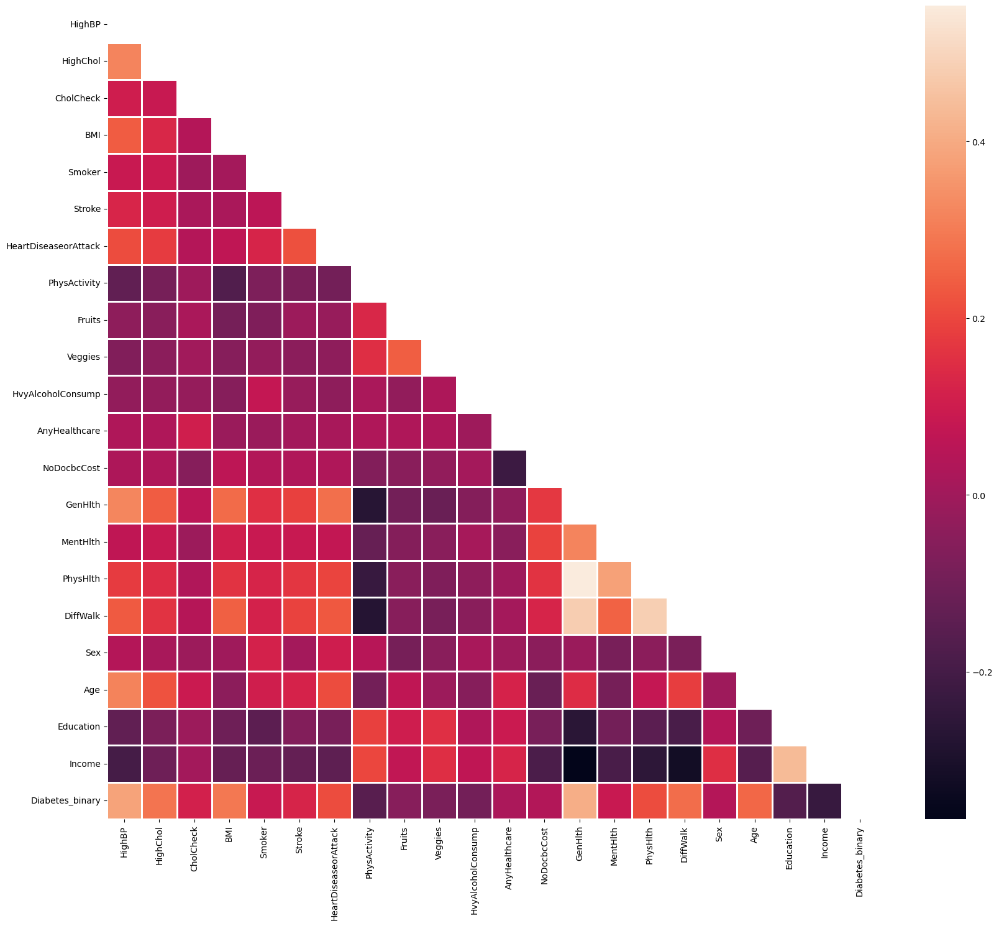

In [78]:
plt.figure(figsize=(20, 17))
matrix = np.triu(df1.corr())
sns.heatmap(df1.corr(), annot=True, linewidth=.8, mask=matrix, cmap="rocket", fmt=".2f");

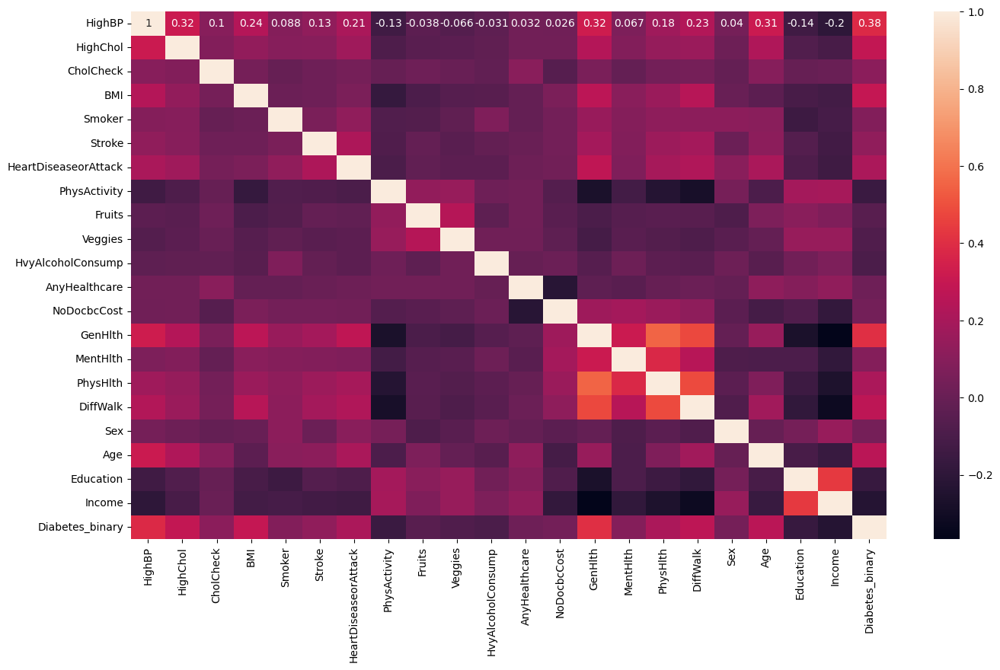

In [79]:
plt.figure(figsize=(16,9))
sns.heatmap(df1.corr(), annot=True);

In [80]:
hig_corr = df1.corr()
hig_corr_features = hig_corr.index[abs(hig_corr["Diabetes_binary"]) >= 0.2]
hig_corr_features

Index(['HighBP', 'HighChol', 'BMI', 'HeartDiseaseorAttack', 'GenHlth',
       'PhysHlth', 'DiffWalk', 'Age', 'Income', 'Diabetes_binary'],
      dtype='object')

In [81]:
## Fitting logistic regression
lg = LogisticRegression(max_iter = 3000)
lg.fit(X_train , y_train)


LogisticRegression(max_iter=3000)

In [82]:
# make predictions on test set
y_pred=lg.predict(X_test)
y_pred1=lg.predict(X_train)
print('Training set score: {:.4f}'.format(lg.score(X_train, y_train)))

print('Test set score: {:.4f}'.format(lg.score(X_test, y_test)))

Training set score: 0.7464
Test set score: 0.7493


In [83]:
from sklearn.metrics import accuracy_score
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy test:", accuracy)
accuracy1 = accuracy_score(y_train, y_pred1)
print("Accuracy train:", accuracy1)

Accuracy test: 0.7493398717465107
Accuracy train: 0.746423086250101


In [84]:
from sklearn.metrics import log_loss

# Calculate the log loss
logloss3 = log_loss(y_test, y_pred)

print("Log Loss:", logloss3)

logloss4 = log_loss(y_train, y_pred1)

print("Log Loss:", logloss4)

Log Loss: 9.034706781240418
Log Loss: 9.139838386683413


In [85]:
## without correlated variables
df2 = df1.drop(columns=['Income','CholCheck','Smoker','Stroke','Sex','HvyAlcoholConsump','AnyHealthcare','Veggies','PhysActivity','Education'])
df2
X_train1 = X_train.drop(columns=['Income','CholCheck','Smoker','Stroke','Sex','HvyAlcoholConsump','AnyHealthcare','Veggies','PhysActivity','Education'])
y_train1 = y_train
X_test1 = X_test.drop(columns=['Income','CholCheck','Smoker','Stroke','Sex','HvyAlcoholConsump','AnyHealthcare','Veggies','PhysActivity','Education'])
y_test1 = y_test

In [86]:
## Fitting logistic regression
lg3 = LogisticRegression(max_iter = 3000)
lg3.fit(X_train1 , y_train1)

# make predictions on test set
y_pred8=lg3.predict(X_test)
y_pred9=lg3.predict(X_train)
print('Training set score: {:.4f}'.format(lg3.score(X_train1, y_train1)))

print('Test set score: {:.4f}'.format(lg3.score(X_test1, y_test1)))


ValueError: The feature names should match those that were passed during fit.
Feature names unseen at fit time:
- AnyHealthcare
- CholCheck
- Education
- HvyAlcoholConsump
- Income
- ...


In [ ]:
df1

In [ ]:
## logistic regression assumption check
## appropriate outcome type
print(y_train.nunique())

In [ ]:
# Keep columns related to continuous variables
cols_to_keep = continuous_var + df_titanic_lt.columns.tolist()[-len(continuous_var):]
cols_to_keep

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt
import sklearn

from pandas import Series, DataFrame
from pylab import rcParams
from sklearn import preprocessing
from sklearn.linear_model import LogisticRegression
#from sklearn.cross_validation import train_test_split
from sklearn import metrics 
from sklearn.metrics import classification_report

In [ ]:
#checking for missing values
df1.isnull().sum()

In [ ]:
## checking for independence between features

sb.heatmap(df1.corr()) 

In [87]:
import numpy as np
import statsmodels.api as sm
from scipy import stats

continuous_var = ['BMI', 'MentHlth', 'PhysHlth']
X_train_continuous = X_train[continuous_var]



# Assuming 'X_train_continuous' contains your continuous independent variables
# 'y_train' contains the dependent variable

# Add a constant to the independent variables
X_train_continuous_with_const = sm.add_constant(X_train_continuous)

# Fit logistic regression model
logit_model = sm.Logit(y_train, X_train_continuous_with_const)
logit_result = logit_model.fit()

# Get the predicted log odds
y_pred_logodds = logit_result.fittedvalues

# Calculate the interaction terms
interaction_terms = X_train_continuous.to_numpy() * y_pred_logodds.values[:, np.newaxis]

# Compute the Box-Tidwell statistic
box_tidwell_statistic, p_value = stats.pearsonr(interaction_terms.flatten(), X_train_continuous.values.flatten())

# Print the results
print("Box-Tidwell Test Statistic:", box_tidwell_statistic)
print("p-value:", p_value)

Optimization terminated successfully.
         Current function value: 0.629871
         Iterations 5
Box-Tidwell Test Statistic: 0.41895093471561223
p-value: 0.0


In [88]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import make_classification

# Generate some sample data for demonstration
#X, y = make_classification(n_samples=1000, n_features=20, n_classes=2, random_state=42)

# Split the data into training and testing sets
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create and fit the Elastic Net logistic regression model
elastic_net_model = LogisticRegression(penalty='elasticnet', solver='saga', l1_ratio=0.5, random_state=42)
elastic_net_model.fit(X_train_scaled, y_train)
y_pred3=elastic_net_model.predict(X_test)
y_pred4=elastic_net_model.predict(X_train)
# Evaluate the model
accuracy1 = elastic_net_model.score(X_test_scaled, y_test)
print("Accuracy1:", accuracy1)
accuracy2 = elastic_net_model.score(X_train_scaled, y_train)
print("Accuracy2:", accuracy2)

Accuracy1: 0.7493870237646171
Accuracy2: 0.7464028776978417


C:\Users\DELL\anaconda3\Lib\site-packages\sklearn\base.py:432: UserWarning: X has feature names, but LogisticRegression was fitted without feature names
  warnings.warn(
C:\Users\DELL\anaconda3\Lib\site-packages\sklearn\base.py:432: UserWarning: X has feature names, but LogisticRegression was fitted without feature names
  warnings.warn(


In [89]:
from sklearn.metrics import log_loss

# Calculate the log loss
logloss1 = log_loss(y_test, y_pred3)

print("Log Loss1:", logloss1)

logloss2 = log_loss(y_train, y_pred4)

print("Log Loss2:", logloss2)

Log Loss1: 18.032023880541917
Log Loss2: 18.01745635423979


In [107]:
## correlation between categorical vs categorical
from itertools import combinations
import scipy.stats as stats
categorical_pred = df1[['Diabetes_binary','HighBP','HighChol','Age','Education','Sex','DiffWalk','GenHlth','HvyAlcoholConsump','AnyHealthcare','NoDocbcCost', 'Veggies','Fruits','PhysActivity','HeartDiseaseorAttack','Stroke','Smoker','CholCheck','Income']]
categorical_pred = categorical_pred.columns.tolist()

combs = combinations(categorical_pred,2)

for comb in combs:
    contingency_table = pd.crosstab(df1[comb[0]],df1[comb[1]])
    chi2, p, _, _ = stats.chi2_contingency(contingency_table)
    print(f"Combination: {comb}")
    print(f"Chi2 value: {chi2}, p-value: {p}\n")

Combination: ('Diabetes_binary', 'HighBP')
Chi2 value: 7202.3532800907715, p-value: 0.0

Combination: ('Diabetes_binary', 'HighChol')
Chi2 value: 4064.2933909446765, p-value: 0.0

Combination: ('Diabetes_binary', 'Age')
Chi2 value: 3693.165487588876, p-value: 0.0

Combination: ('Diabetes_binary', 'Education')
Chi2 value: 1400.69632501903, p-value: 2.0800769041296942e-303

Combination: ('Diabetes_binary', 'Sex')
Chi2 value: 90.3754338818838, p-value: 1.969969463501881e-21

Combination: ('Diabetes_binary', 'DiffWalk')
Chi2 value: 3659.365750128477, p-value: 0.0

Combination: ('Diabetes_binary', 'GenHlth')
Chi2 value: 8605.893878868608, p-value: 0.0

Combination: ('Diabetes_binary', 'HvyAlcoholConsump')
Chi2 value: 457.6822180140988, p-value: 1.535618713555981e-101

Combination: ('Diabetes_binary', 'AnyHealthcare')
Chi2 value: 23.04776133143493, p-value: 1.5802640550520318e-06

Combination: ('Diabetes_binary', 'NoDocbcCost')
Chi2 value: 65.50427118754209, p-value: 5.798815430575449e-16

C

In [91]:
# VIF dataframe 
vif_data = pd.DataFrame() 
vif_data["feature"] = X_train.columns 
  
# calculating VIF for each feature 
vif_data["VIF"] = [variance_inflation_factor(X_train.values, i) 
                          for i in range(len(X_train.columns))] 
  
print(vif_data)

                 feature        VIF
0                 HighBP   3.008672
1               HighChol   2.466889
2              CholCheck  32.127362
3                    BMI  18.193386
4                 Smoker   2.041667
5                 Stroke   1.164613
6   HeartDiseaseorAttack   1.388180
7           PhysActivity   3.826895
8                 Fruits   2.836926
9                Veggies   5.191859
10     HvyAlcoholConsump   1.065752
11         AnyHealthcare  21.883698
12           NoDocbcCost   1.219795
13               GenHlth  13.215440
14              MentHlth   1.514335
15              PhysHlth   2.243379
16              DiffWalk   2.089326
17                   Sex   1.994081
18                   Age  18.219626
19             Education  16.224076
20                Income   7.841038


In [92]:
### knn
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import sklearn

In [93]:
X_train

,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
26629,1,1,1,27.0,1,0,0,1,1,1,...,1,0,1,0.0,0.0,0,0,4,3,4
31609,0,0,1,24.0,0,0,0,1,1,1,...,1,0,2,3.0,0.0,0,1,1,4,2
44065,0,1,1,27.0,1,0,0,1,1,1,...,1,0,2,0.0,0.0,0,1,3,4,4
35884,1,1,1,24.0,1,0,1,1,1,0,...,1,0,1,0.0,18.0,1,0,4,4,1
45382,1,1,1,22.0,1,0,0,1,1,1,...,1,0,4,0.0,1.0,0,1,4,4,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64327,0,0,1,32.0,0,0,0,0,1,1,...,1,0,4,15.0,10.0,0,0,3,4,4
34470,1,1,1,19.0,0,0,0,1,1,1,...,1,0,2,0.0,2.0,0,0,4,4,4
41281,1,1,1,21.0,1,0,1,1,0,0,...,1,0,3,0.0,0.0,0,0,3,2,1
46472,1,1,1,31.0,1,0,0,1,1,0,...,1,0,1,0.0,30.0,0,0,2,3,2


In [94]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train3 = sc.fit_transform(X_train)
X_test3 = sc.transform(X_test)

In [95]:
from sklearn.neighbors import KNeighborsClassifier
classifier = KNeighborsClassifier(n_neighbors = 5, metric = 'minkowski', p = 2)
classifier.fit(X_train3, y_train)

KNeighborsClassifier()

In [96]:
y_pred10 = classifier.predict(X_test3)
y_pred11 = classifier.predict(X_train3)

In [97]:
from sklearn.metrics import confusion_matrix,accuracy_score
cm = confusion_matrix(y_test, y_pred10)
ac1 = accuracy_score(y_test,y_pred10)
ac2 = accuracy_score(y_train,y_pred11)

In [98]:
ac1

0.7099679366276876

In [99]:
ac2

0.7958127879718697

In [378]:
from numpy import mean
from numpy import std
from sklearn.datasets import make_classification
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

In [380]:
# prepare the cross-validation procedure
cv = KFold(n_splits=10, random_state=1, shuffle=True)

In [382]:
# evaluate model
scores = cross_val_score(logistic_model, X, y_encoded, scoring='accuracy', cv=cv, n_jobs=-1)
# report performance
print('Accuracy: %.3f (%.3f)' % (mean(scores), std(scores)))

Accuracy: 0.934 (0.019)


In [378]:
from numpy import mean
from numpy import std
from sklearn.datasets import make_classification
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

In [380]:
# prepare the cross-validation procedure
cv = KFold(n_splits=10, random_state=1, shuffle=True)

In [382]:
# evaluate model
scores = cross_val_score(logistic_model, X, y_encoded, scoring='accuracy', cv=cv, n_jobs=-1)
# report performance
print('Accuracy: %.3f (%.3f)' % (mean(scores), std(scores)))

Accuracy: 0.934 (0.019)


In [100]:
## cramer
# Load necessary packages and functions 
import scipy.stats as stats 
import numpy as np 

In [102]:
# Finding Chi-squared test statistic, 
# sample size, and minimum of rows 
# and columns 
# Finding Chi-squared test statistic,  
# sample size, and minimum of rows and 
# columns 
X2 = stats.chi2_contingency(df1, correction=False)[0] 
N = np.sum(df1) 
minimum_dimension = min(df1.shape)-1
  
# Calculate Cramer's V 
result = np.sqrt((X2/N) / minimum_dimension) 
  
# Print the result 
print(result)  

HighBP                  1.657443
HighChol                1.714453
CholCheck               1.257900
BMI                     0.227385
Smoker                  1.805938
Stroke                  4.963860
HeartDiseaseorAttack    3.225552
PhysActivity            1.482153
Fruits                  1.588467
Veggies                 1.398402
HvyAlcoholConsump       5.985149
AnyHealthcare           1.271602
NoDocbcCost             4.057557
GenHlth                 0.738383
MentHlth                0.641560
PhysHlth                0.516570
DiffWalk                2.478137
Sex                     1.837503
Age                     0.715835
Education               0.715235
Income                  0.791306
Diabetes_binary         1.757116
dtype: float64


C:\Users\DELL\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)
